In [2]:
import pandas as pd 
from autogluon.timeseries import TimeSeriesDataFrame, TimeSeriesPredictor
from dateutil import parser
import numpy as np
from functions import GMT_correction
import matplotlib.pyplot as plt


/home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset = pd.read_csv(r'/home/iva/Desktop/values_station1_train.csv')
timestamp = dataset.iloc[:,1]
# check if they are missing timestamps (difference between timestamps more than 5 min)
#output = (pd.to_datetime(timestamp).diff() > '00:05:00')
#output.to_csv("checking_timestamps.csv", index=False)
temperatura = dataset.iloc[:,0].values
time = dataset.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))

freq_5_min = pd.date_range(time_GMT[0],periods=229585,freq='5T')
#print(freq_5_min[-1])
#print(time_GMT[-1])

In [3]:
df = pd.DataFrame()
df["timestamp"] = freq_5_min
df["target"] = temperatura
df["item_id"] = "T"
train_data = TimeSeriesDataFrame.from_data_frame(
    df,
    id_column="item_id",
    timestamp_column="timestamp"
)
print(train_data)

                             target
item_id timestamp                  
T       2020-10-05 13:25:00    24.1
        2020-10-05 13:30:00    24.1
        2020-10-05 13:35:00    24.1
        2020-10-05 13:40:00    24.1
        2020-10-05 13:45:00    24.1
...                             ...
        2022-12-11 17:05:00     0.7
        2022-12-11 17:10:00     0.8
        2022-12-11 17:15:00     0.9
        2022-12-11 17:20:00     1.1
        2022-12-11 17:25:00     0.9

[229585 rows x 1 columns]


In [6]:
predictor = TimeSeriesPredictor(
    prediction_length=1,
    path="moj dataset",
    target="target",
    eval_metric="sMAPE"
)

predictor.fit(
    train_data,
    presets="medium_quality",
    time_limit=600,
)

================ TimeSeriesPredictor ================
TimeSeriesPredictor.fit() called
Setting presets to: medium_quality
Fitting with arguments:
{'enable_ensemble': True,
 'evaluation_metric': 'sMAPE',
 'excluded_model_types': None,
 'hyperparameter_tune_kwargs': None,
 'hyperparameters': 'medium_quality',
 'num_val_windows': 1,
 'prediction_length': 1,
 'random_seed': None,
 'target': 'target',
 'time_limit': 600,
 'verbosity': 2}
Provided training data set with 229585 rows, 1 items (item = single time series). Average time series length is 229585.0. Data frequency is '5T'.
AutoGluon will save models to moj dataset/
AutoGluon will gauge predictive performance using evaluation metric: 'sMAPE'
	This metric's sign has been flipped to adhere to being 'higher is better'. The reported score can be multiplied by -1 to get the metric value.

Provided dataset contains following columns:
	target:           'target'

Starting training. Start time is 2023-06-26 14:09:47
Models that will be train

In [48]:
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
timestamp = dataset.iloc[:,1]
# check if they are missing timestamps (difference between timestamps more than 5 min)
#print(pd.to_datetime(timestamp).diff() > '00:05:00')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))
test_data_list = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
for j in range(1,5):
    df_test = pd.DataFrame()
    df_test["timestamp"] = freq_5_min[:j]
    df_test["target"] = temperatura[:j]
    df_test["item_id"] = "T"
    test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")
    test_data_list.append(test_data)

print(test_data_list)

'''for j in range(1, 43023):
    freq_5_min = pd.date_range(time_GMT[0],periods=j,freq='5T')
    df_test = pd.DataFrame()
    df_test["timestamp"] = freq_5_min
    df_test["target"] = temperatura[:j]
    df_test["item_id"] = "T"
    test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")
    test_data_list.append(test_data)
print(test_data_list)'''

[                             target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8,                              target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5,                              target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7,                              target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8]


'for j in range(1, 43023):\n    freq_5_min = pd.date_range(time_GMT[0],periods=j,freq=\'5T\')\n    df_test = pd.DataFrame()\n    df_test["timestamp"] = freq_5_min\n    df_test["target"] = temperatura[:j]\n    df_test["item_id"] = "T"\n    test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")\n    test_data_list.append(test_data)\nprint(test_data_list)'

In [49]:
predictions = pd.DataFrame()
for k in test_data_list[2:]:
   predictions = pd.concat([predictions, predictor_2.predict(k)])

print(predictions)
#predictions = predictions.loc[item_id]



Global seed set to 123
Global seed set to 123


                                 mean       0.1       0.2       0.3       0.4  \
item_id timestamp                                                               
T       2022-12-31 23:15:00  0.070995 -0.592031 -0.293425 -0.149148 -0.031006   
        2022-12-31 23:20:00  0.145112 -0.499034 -0.208829 -0.068841  0.045941   

                                  0.5       0.6       0.7       0.8       0.9  
item_id timestamp                                                              
T       2022-12-31 23:15:00  0.096569  0.177157  0.319199  0.467736  0.738088  
        2022-12-31 23:20:00  0.169922  0.248318  0.386363  0.530713  0.792565  


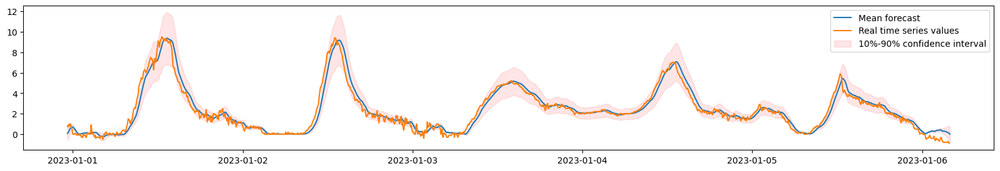

In [132]:

item_id = "T"
y_past = train_data[2:10].loc[item_id]["target"]
y_test = test_data[3:1500].loc[item_id]["target"]
plt.figure(figsize=(20, 3))
#plt.plot(y_past, label="Past time series values")
plt.plot(predictions["mean"], label="Mean forecast")
plt.plot(y_test, label="Real time series values")

plt.fill_between(predictions.index, predictions["0.1"], predictions["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.legend()

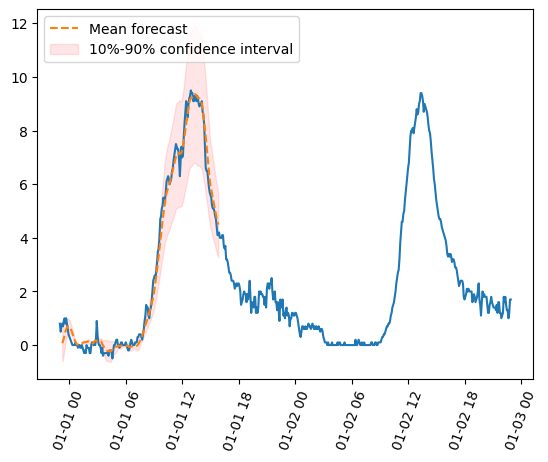

In [150]:
from data import data_interval
prediction_interval = data_interval(dataset_test, '2023-01-01 ', '2023-01-02 ')
temperatura_prediction_interval = prediction_interval.iloc[:,0]
timestamps_prediction_interval = prediction_interval.iloc[:,1]
timestamps_prediction_interval_GMT = []
for i in timestamps_prediction_interval:
    timestamps_prediction_interval_GMT.append(np.datetime64(GMT_correction(i)))
predictions = predictions[0:len(timestamps_prediction_interval_GMT)]
plt.plot(timestamps_prediction_interval_GMT, temperatura_prediction_interval)
plt.plot(predictions["mean"], label="Mean forecast", linestyle='--')
plt.fill_between(predictions.index, predictions["0.1"], predictions["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.xticks(rotation=70)
plt.legend(loc = 'upper left')

In [134]:
# evaluating the performance of different models 
predictor.leaderboard(test_data, silent=True)

Additional data provided, testing on additional data. Resulting leaderboard will be sorted according to test score (`score_test`).


,model,score_test,score_val,pred_time_test,pred_time_val,fit_time_marginal,fit_order
0,AutoETS,-0.106710,-0.220233,31.980772,34.777610,0.273605,4
1,Naive,-0.117647,-0.200000,4.296228,3.902790,0.302912,1
2,Theta,-0.147657,-0.244709,45.137585,39.475868,0.249233,3
3,SeasonalNaive,-2.000000,-1.272727,3.473084,3.329700,0.269587,2
4,RecursiveTabular,-2.000000,-1.247906,0.095905,1.552747,7.840104,5
5,DeepAR,-2.000000,-0.030023,0.039487,0.298801,521.520369,6


In [8]:
### upostevaj tudi ostale parametre kot dodatne kolone v train data in pol tud v test data
wind_direction = dataset.iloc[:,2].values
relative_humidity = dataset.iloc[:,3].values
air_pressure = dataset.iloc[:,4].values
wind_speed = dataset.iloc[:,5].values
rain_intensity = dataset.iloc[:,6].values
dataset_param = pd.DataFrame()

dataset_param["timestamp"] = freq_5_min
dataset_param["target"] = temperatura
dataset_param["item_id"] = "T"
dataset_param["wind_direction"] = wind_direction
dataset_param["relative_humidity"] = relative_humidity
dataset_param["air_pressure"] = air_pressure
dataset_param["wind_speed"] = wind_speed
dataset_param["rain_intensity"] = rain_intensity

train_data_1 = TimeSeriesDataFrame.from_data_frame(
    dataset_param,
    id_column="item_id",
    timestamp_column="timestamp"
)
print(train_data_1)

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:2                                                                                    │
│                                                                                                  │
│    1 ### upostevaj tudi ostale parametre kot dodatne kolone v train data in pol tud v test da    │
│ ❱  2 wind_direction = dataset.iloc[:,2].values                                                   │
│    3 relative_humidity = dataset.iloc[:,3].values                                                │
│    4 air_pressure = dataset.iloc[:,4].values                                                     │
│    5 wind_speed = dataset.iloc[:,5].values                                                       │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'dataset' is not defined

In [9]:
predictor = TimeSeriesPredictor(
    prediction_length=1,
    path="vse parametre",
    target="target",
    eval_metric="sMAPE",
    known_covariates_names=["wind_direction", "relative_humidity", "air_pressure", "wind_speed", "rain_intensity"]
)

predictor.fit(
    train_data_1,
    presets="medium_quality",
    time_limit=600,
)

================ TimeSeriesPredictor ================
TimeSeriesPredictor.fit() called
Setting presets to: medium_quality
Fitting with arguments:
{'enable_ensemble': True,
 'evaluation_metric': 'sMAPE',
 'excluded_model_types': None,
 'hyperparameter_tune_kwargs': None,
 'hyperparameters': 'medium_quality',
 'num_val_windows': 1,
 'prediction_length': 1,
 'random_seed': None,
 'target': 'target',
 'time_limit': 600,
 'verbosity': 2}
Provided training data set with 229585 rows, 1 items (item = single time series). Average time series length is 229585.0. Data frequency is '5T'.
AutoGluon will save models to vse parametre/
AutoGluon will gauge predictive performance using evaluation metric: 'sMAPE'
	This metric's sign has been flipped to adhere to being 'higher is better'. The reported score can be multiplied by -1 to get the metric value.

Provided dataset contains following columns:
	target:           'target'
	known covariates: ['wind_direction', 'relative_humidity', 'air_pressure', 'w

In [38]:
# load above predictor 
predictor_1 = TimeSeriesPredictor.load(r'/home/iva/Desktop/models_forecasting/vse parametre/', require_version_match=True)


In [20]:
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
timestamp = dataset.iloc[:,1]
# check if they are missing timestamps (difference between timestamps more than 5 min)
#print(pd.to_datetime(timestamp).diff() > '00:05:00')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))
test_data_list = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
wind_direction = dataset_test.iloc[:,2].values
relative_humidity = dataset_test.iloc[:,3].values
air_pressure = dataset_test.iloc[:,4].values
wind_speed = dataset_test.iloc[:,5].values
rain_intensity = dataset_test.iloc[:,6].values
for j in range(1,1500):
    df_test = pd.DataFrame()
    df_test["timestamp"] = freq_5_min[:j]
    df_test["target"] = temperatura[:j]
    df_test["item_id"] = "T"
    df_test["wind_direction"] = wind_direction[:j]
    df_test["relative_humidity"] = relative_humidity[:j]
    df_test["air_pressure"] = air_pressure[:j]
    df_test["wind_speed"] = wind_speed[:j]
    df_test["rain_intensity"] = rain_intensity[:j]
    
    test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")
    test_data_list.append(test_data)

print(test_data_list)

[                             target  wind_direction  relative_humidity  \
item_id timestamp                                                        
T       2022-12-31 23:00:00     0.8           316.0               90.7   

                             air_pressure  wind_speed  rain_intensity  
item_id timestamp                                                      
T       2022-12-31 23:00:00         972.5        1.48             0.0  ,                              target  wind_direction  relative_humidity  \
item_id timestamp                                                        
T       2022-12-31 23:00:00     0.8           316.0               90.7   
        2022-12-31 23:05:00     0.5           334.0               89.9   

                             air_pressure  wind_speed  rain_intensity  
item_id timestamp                                                      
T       2022-12-31 23:00:00         972.5        1.48             0.0  
        2022-12-31 23:05:00         972.5     

In [13]:
for k in test_data_list[2:]:
    print(k)

                             target  wind_direction  relative_humidity  \
item_id timestamp                                                        
T       2022-12-31 23:00:00     0.8           316.0               90.7   
        2022-12-31 23:05:00     0.5           334.0               89.9   
        2022-12-31 23:10:00     0.7           340.0               91.3   

                             air_pressure  wind_speed  rain_intensity  
item_id timestamp                                                      
T       2022-12-31 23:00:00         972.5        1.48             0.0  
        2022-12-31 23:05:00         972.5        1.53             0.0  
        2022-12-31 23:10:00         972.5        1.06             0.0  
                             target  wind_direction  relative_humidity  \
item_id timestamp                                                        
T       2022-12-31 23:00:00     0.8           316.0               90.7   
        2022-12-31 23:05:00     0.5           3

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:2                                                                                    │
│                                                                                                  │
│   1 for k in test_data_list[2:]:                                                                 │
│ ❱ 2 │   print(k)                                                                                 │
│   3                                                                                              │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/pandas/core/frame.py:1064 in     │
│ __repr__                                                                                         │
│                                                                                                  │
│    1061 │   │   │   return buf.getvalue()                                                        │
│    1062 │   │                                                                                    │
│    1063 │   │   repr_params = fmt.get_dataframe_repr_params()                                    │
│ ❱  1064 │   │   return self.to_string(**repr_params)                                             │
│    1065 │                                                                                        │
│    1066 │   def _repr_html_(self) -> str | None:                                                 │
│    1067 │   │   """                                                                              │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/pandas/core/frame.py:1245 in     │
│ to_string                                                                                        │
│                                                                                                  │
│    1242 │   │   │   │   show_dimensions=show_dimensions,                                         │
│    1243 │   │   │   │   decimal=decimal,                                                         │
│    1244 │   │   │   )                                                                            │
│ ❱  1245 │   │   │   return fmt.DataFrameRenderer(formatter).to_string(                           │
│    1246 │   │   │   │   buf=buf,                                                                 │
│    1247 │   │   │   │   encoding=encoding,                                                       │
│    1248 │   │   │   │   line_width=line_width,                                                   │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/pandas/io/formats/format.py:1136 │
│ in to_string                                                                                     │
│                                                                                                  │
│   1133 │   │   from pandas.io.formats.string import StringFormatter                              │
│   1134 │   │                                                                                     │
│   1135 │   │   string_formatter = StringFormatter(self.fmt, line_width=line_width)               │
│ ❱ 1136 │   │   string = string_formatter.to_string()                                             │
│   1137 │   │   return save_to_buffer(string, buf=buf, encoding=encoding)                         │
│   1138 │                                                                                         │
│   1139 │   @deprecate_kwarg(old_arg_name="line_terminator", new_arg_name="lineterminator")       │
│                                                            

In [19]:
predictions_param = pd.DataFrame()
future_index = freq_5_min[:1500]
known_covariates = pd.DataFrame()
known_covariates["timestamp"] = freq_5_min[:1500]
known_covariates["item_id"] = 'T'
known_covariates["wind_direction"] = wind_direction[:1500]
known_covariates["relative_humidity"] = relative_humidity[:1500]
known_covariates["air_pressure"] = air_pressure[:1500]
known_covariates["wind_speed"] = wind_speed[:1500]
known_covariates["rain_intensity"] = rain_intensity[:1500]
known_covariates_real = TimeSeriesDataFrame.from_data_frame(known_covariates,id_column="item_id",timestamp_column="timestamp")
for k in test_data_list[2:]:
    
   predictions_param = pd.concat([predictions_param, predictor_1.predict(k, known_covariates=known_covariates_real)])

print(predictions_param)
#predictions_param = predictions_param.loc[item_id]

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:6                                                                                    │
│                                                                                                  │
│    3 known_covariates = pd.DataFrame()                                                           │
│    4 known_covariates["timestamp"] = freq_5_min[:1500]                                           │
│    5 known_covariates["item_id"] = 'T'                                                           │
│ ❱  6 known_covariates["wind_direction"] = wind_direction[:1500]                                  │
│    7 known_covariates["relative_humidity"] = relative_humidity[:1500]                            │
│    8 known_covariates["air_pressure"] = air_pressure[:1500]                                      │
│    9 known_covariates["wind_speed"] = wind_speed[:1500]                                          │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'wind_direction' is not defined

In [97]:
# save predictions_param to a file because it took 30 min to execute the above code
predictions_param.to_csv("predictions_param.csv", index=False)

In [140]:
print(test_data)

                             target  wind_direction  relative_humidity  \
item_id timestamp                                                        
T       2022-12-31 23:00:00     0.8           316.0               90.7   
        2022-12-31 23:05:00     0.5           334.0               89.9   
        2022-12-31 23:10:00     0.7           340.0               91.3   
        2022-12-31 23:15:00     0.8           319.0               91.3   
        2022-12-31 23:20:00     0.7           323.0               90.9   
...                             ...             ...                ...   
        2023-01-06 03:30:00    -0.8           274.0               91.8   
        2023-01-06 03:35:00    -0.8           314.0               91.9   
        2023-01-06 03:40:00    -0.7           324.0               91.9   
        2023-01-06 03:45:00    -0.8           188.0               91.7   
        2023-01-06 03:50:00    -0.9           215.0               91.7   

                             air_pres

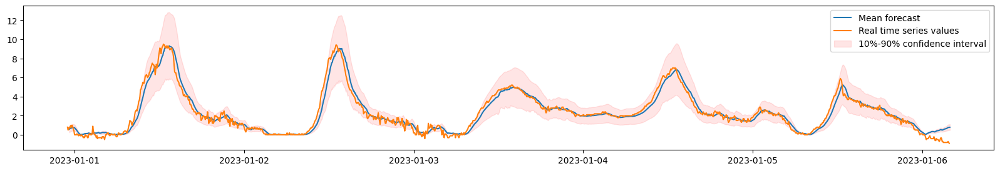

In [29]:
item_id = "T"
#predictions_param = predictions_param.loc[item_id]

y_test = test_data.loc[item_id]["target"]
plt.figure(figsize=(20, 3))
plt.plot(predictions_param["mean"], label="Mean forecast")
plt.plot(y_test, label="Real time series values")
plt.fill_between(predictions_param.index, predictions_param["0.1"], predictions_param["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.legend()

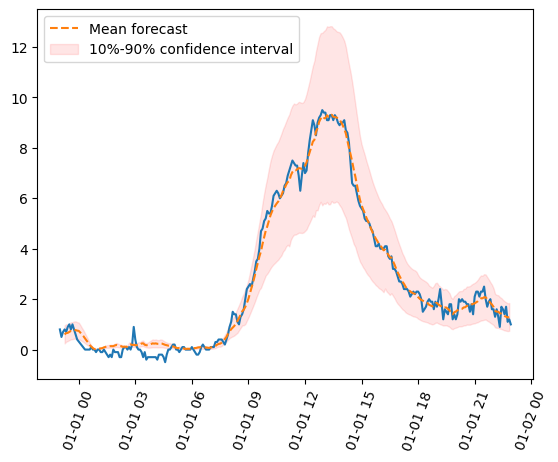

In [149]:
from data import data_interval
prediction_interval = data_interval(dataset_test, '2022-31-12 ', '2023-01-01 ')
temperatura_prediction_interval = prediction_interval.iloc[:,0]
timestamps_prediction_interval = prediction_interval.iloc[:,1]
timestamps_prediction_interval_GMT = []
for i in timestamps_prediction_interval:
    timestamps_prediction_interval_GMT.append(np.datetime64(GMT_correction(i)))
predictions_param_1 = predictions_param[0:len(timestamps_prediction_interval_GMT)]
plt.plot(timestamps_prediction_interval_GMT, temperatura_prediction_interval)
plt.plot(predictions_param_1["mean"], label="Mean forecast", linestyle='--')
plt.fill_between(predictions_param_1.index, predictions_param_1["0.1"], predictions_param_1["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.xticks(rotation=70)
plt.legend(loc = 'upper left')

In [48]:
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
timestamp = dataset.iloc[:,1]
# check if they are missing timestamps (difference between timestamps more than 5 min)
#print(pd.to_datetime(timestamp).diff() > '00:05:00')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))

dataset_test.iloc[:,1] = time_GMT
print(dataset_test)

       AMBIENT_TEMPERATURE           timestamp  WIND_DIRECTION  \
0                      0.8 2022-12-31 23:00:00           316.0   
1                      0.5 2022-12-31 23:05:00           334.0   
2                      0.7 2022-12-31 23:10:00           340.0   
3                      0.8 2022-12-31 23:15:00           319.0   
4                      0.7 2022-12-31 23:20:00           323.0   
...                    ...                 ...             ...   
43018                 14.0 2023-05-31 21:35:00           156.0   
43019                 13.9 2023-05-31 21:40:00           157.0   
43020                 13.9 2023-05-31 21:45:00           162.0   
43021                 13.9 2023-05-31 21:50:00            53.0   
43022                 13.9 2023-05-31 21:55:00           212.0   

       RELATIVE_HUMIDITY  AIR_PRESSURE  WIND_SPEED  RAIN_INTENSITY  \
0                   90.7         972.5        1.48             0.0   
1                   89.9         972.5        1.53             0.0 

/tmp/ipykernel_4773/2953658366.py:11: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  dataset_test.iloc[:,1] = time_GMT


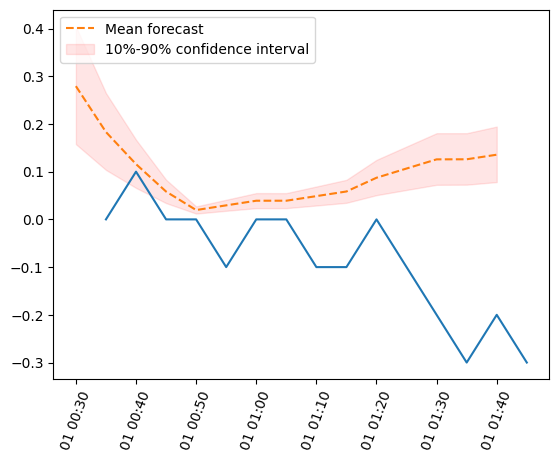

In [156]:
eno_uro = dataset_test[15:30]
timestamps_prediction_interval = eno_uro.iloc[:,1].values
temperatura_prediction_interval = eno_uro.iloc[:,0].values
timestamps_prediction_interval_GMT = []

for i in timestamps_prediction_interval:
    timestamps_prediction_interval_GMT.append(np.datetime64(GMT_correction(i)))


predictions_param_2 = predictions_param[15:30]
plt.plot(timestamps_prediction_interval_GMT, temperatura_prediction_interval)
plt.plot(predictions_param_2["mean"], label="Mean forecast", linestyle='--')
plt.fill_between(predictions_param_2.index, predictions_param_2["0.1"], predictions_param_2["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.xticks(rotation=70)
plt.legend(loc = 'upper left')

In [157]:
## showing scores
predictor_1.leaderboard(test_data, silent=True)

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time_marginal,fit_order
0,AutoETS,-0.106710,-0.220233,35.088398,32.838397,0.382155,4
1,Naive,-0.117647,-0.200000,7.544845,4.515615,0.364870,1
2,Theta,-0.147657,-0.244709,36.766878,38.277725,0.327268,3
3,SeasonalNaive,-2.000000,-1.272727,3.462277,3.575101,0.331610,2
4,RecursiveTabular,-2.000000,-1.247906,3.845092,1.611494,8.467613,5
5,DeepAR,-2.000000,-0.010490,0.045665,0.363534,524.085454,6


In [47]:
## scores for predictor. without other parameters in data 
predictor_2 = TimeSeriesPredictor.load(r'/home/iva/Desktop/models_forecasting/moj dataset/', require_version_match=True)
#predictor_2.leaderboard(test_data, silent=True)


['2022-12-31T23:15:00.000000000' '2022-12-31T23:20:00.000000000'
 '2022-12-31T23:25:00.000000000' ... '2023-01-06T03:45:00.000000000'
 '2023-01-06T03:50:00.000000000' '2023-01-06T03:55:00.000000000']


Text(0.5, 1.0, 'MAE ')

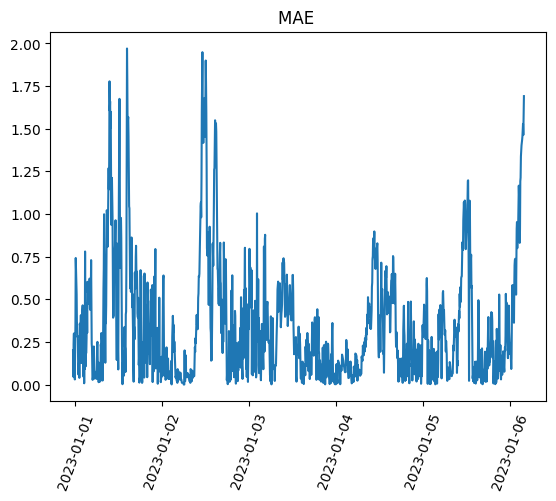

In [192]:
### showing error MAE through time 
y_test = test_data.loc[item_id]["target"]
# to be the same size as predictions_param, thats why I exclude the first two samples
y_test = y_test[2:]
mae = abs(predictions_param["mean"] - y_test)
mae = mae.dropna()
times = predictions_param.index.values
plt.plot(times[1:], mae)
plt.xticks(rotation=70)
plt.title('MAE ')

In [44]:
### showing error MAE through time 

predictions_brez_parametrov = pd.DataFrame()
for k in test_data_list[2:]:
   predictions_brez_parametrov = pd.concat([predictions_brez_parametrov, predictor_2.predict(k)])


Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:5                                                                                    │
│                                                                                                  │
│   2                                                                                              │
│   3 predictions_brez_parametrov = pd.DataFrame()                                                 │
│   4 for k in test_data_list[2:]:                                                                 │
│ ❱ 5    predictions_brez_parametrov = pd.concat([predictions_brez_parametrov, predictor_2.pre     │
│   6                                                                                              │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/autogluon/timeseries/predictor.p │
│ y:630 in predict                                                                                 │
│                                                                                                  │
│   627 │   │   # Don't use data.item_ids in case data is not a TimeSeriesDataFrame                │
│   628 │   │   original_item_id_order = data.reset_index()[ITEMID].unique()                       │
│   629 │   │   data = self._check_and_prepare_data_frame(data)                                    │
│ ❱ 630 │   │   predictions = self._learner.predict(data, known_covariates=known_covariates, mod   │
│   631 │   │   return predictions.reindex(original_item_id_order, level=ITEMID)                   │
│   632 │                                                                                          │
│   633 │   def evaluate(self, data: Union[TimeSeriesDataFrame, pd.DataFrame], **kwargs):          │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/autogluon/timeseries/learner.py: │
│ 198 in predict                                                                                   │
│                                                                                                  │
│   195 │   │   data = self.feature_generator.transform(data)                                      │
│   196 │   │   known_covariates = self.feature_generator.transform_future_known_covariates(know   │
│   197 │   │   known_covariates = self._align_covariates_with_forecast_index(known_covariates=k   │
│ ❱ 198 │   │   return self.load_trainer().predict(                                                │
│   199 │   │   │   data=data, known_covariates=known_covariates, model=model, use_cache=use_cac   │
│   200 │   │   )                                                                                  │
│   201                                                                                            │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/autogluon/timeseries/trainer/abs │
│ tract_trainer.py:836 in predict                                                                  │
│                                                                                                  │
│    833 │   │   **kwargs,                                                                         │
│    834 │   ) -> TimeSeriesDataFrame:                                                             │
│    835 │   │   model_name = self._get_model_for_prediction(model)                                │
│ ❱  836 │   │   model_pred_dict = self.get_model_pred_dict(                                       │
│    837 │   │   │   model_names=[model_name], data=data, known_covariates=known_covariates, use_  │
│    838 │   │   )                                           

In [184]:
predictions_brez_parametrov.to_csv("predictions_brez_param.csv", index=False)

Text(0.5, 1.0, 'MAE, single input')

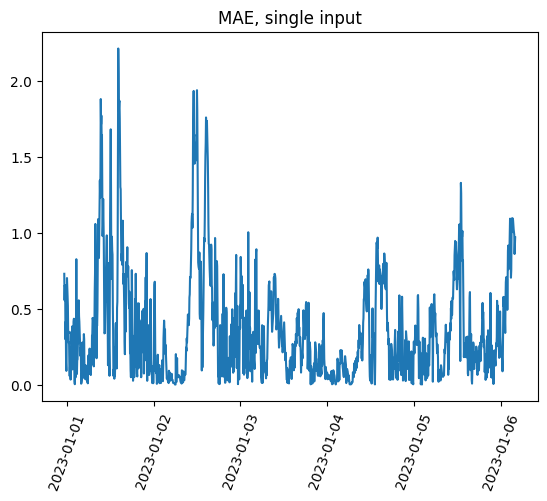

In [201]:

y_test = test_data.loc[item_id]["target"]
# to be the same size as predictions_param, thats why I exclude the first two samples
y_test = y_test[2:]
mae = abs(predictions_brez_parametrov["mean"] - y_test)
mae = mae.dropna()
mae = mae.values
times = predictions_brez_parametrov.loc[item_id]
times = times.index.values
plt.plot(times[1:], mae)
plt.xticks(rotation=70)
plt.title('MAE, single input')

In [209]:
## testing on another location the trained model

dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station2_test.csv')
timestamp = dataset.iloc[:,1]
# check if they are missing timestamps (difference between timestamps more than 5 min)
#print(pd.to_datetime(timestamp).diff() > '00:05:00')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))
test_data_list_station2 = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
for j in range(1,1500):
    df_test = pd.DataFrame()
    df_test["timestamp"] = freq_5_min[:j]
    df_test["target"] = temperatura[:j]
    df_test["item_id"] = "T"
    test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")
    test_data_list_station2.append(test_data)

print(test_data_list)


[                             target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8,                              target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5,                              target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7,                              target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8,                              target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8
        2022-12-31 23:20:00     0.7,                              target
item_id timestamp                  
T       2022-12-31 23:

In [205]:
predictions_brez_parametrov_another_location = pd.DataFrame()
for k in test_data_list_station2[2:]:
   predictions_brez_parametrov_another_location = pd.concat([predictions_brez_parametrov_another_location, predictor_2.predict(k)])

Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed

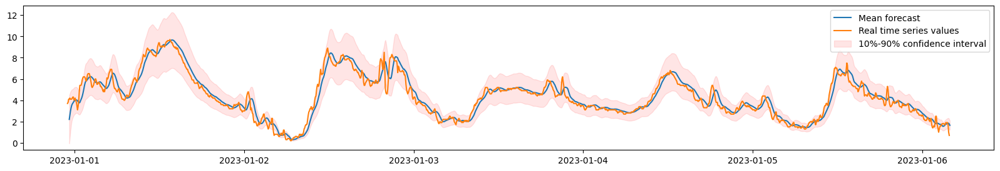

In [212]:
predictions_brez_parametrov_another_location = predictions_brez_parametrov_another_location.loc[item_id]
item_id = "T"


y_test = test_data.loc[item_id]["target"]
plt.figure(figsize=(20, 3))
plt.plot(predictions_brez_parametrov_another_location["mean"], label="Mean forecast")
plt.plot(y_test, label="Real time series values")
plt.fill_between(predictions_brez_parametrov_another_location.index, predictions_brez_parametrov_another_location["0.1"], predictions_brez_parametrov_another_location["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.legend()

In [21]:
predictions_brez_parametrov = pd.read_csv("/home/iva/Desktop/models_forecasting/predictions_brez_param.csv")
print(predictions_brez_parametrov)

          mean       0.1       0.2       0.3       0.4       0.5       0.6  \
0     0.070995 -0.592031 -0.293425 -0.149148 -0.031006  0.096569  0.177157   
1     0.145112 -0.499034 -0.208829 -0.068841  0.045941  0.169922  0.248318   
2     0.245992 -0.323546 -0.066800  0.056701  0.158194  0.267873  0.337346   
3     0.368725 -0.141481  0.088767  0.198958  0.289889  0.388238  0.450727   
4     0.502056  0.056252  0.257669  0.353538  0.433000  0.519024  0.573864   
...        ...       ...       ...       ...       ...       ...       ...   
1492  0.185225 -0.377358 -0.123702 -0.001790  0.098466  0.206823  0.275494   
1493  0.159269 -0.463579 -0.182878 -0.047681  0.063309  0.183226  0.259123   
1494  0.119373 -0.537799 -0.241767 -0.098874  0.018228  0.144700  0.224639   
1495  0.068684 -0.643602 -0.322861 -0.167775 -0.040857  0.096177  0.182700   
1496  0.007606 -0.765907 -0.417664 -0.249126 -0.111301  0.037487  0.131379   

           0.7       0.8       0.9  
0     0.319199  0.467736  

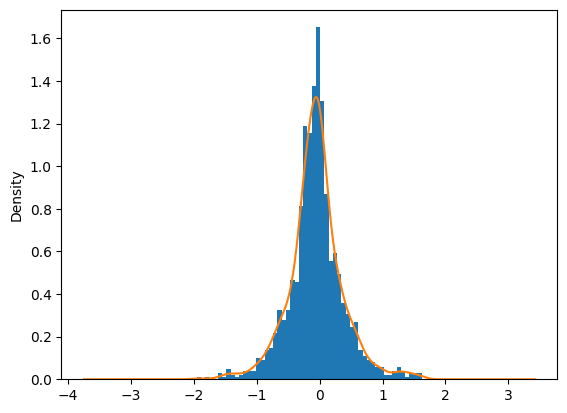

In [15]:
predictions_brez_parametrov = pd.read_csv("/home/iva/Desktop/models_forecasting/predictions_brez_param.csv")
predictions_z_parametrov = pd.read_csv("/home/iva/Desktop/models_forecasting/predictions_param.csv")
item_id = "T"
y_test = test_data.loc[item_id]["target"]
error_brez_parametrov = y_test[2:].values - predictions_brez_parametrov["mean"].values
plt.hist(error_brez_parametrov, bins='auto', density=True)
error_brez_parametrov_series = pd.Series(error_brez_parametrov)
error_brez_parametrov_series.plot.kde()
plt.show()

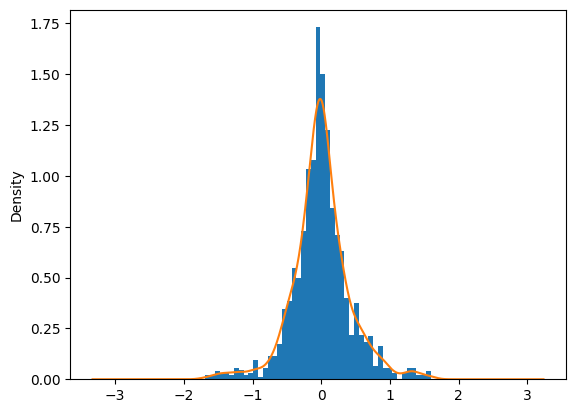

In [21]:
item_id = "T"
y_test = test_data.loc[item_id]["target"]
error_z_parametrov = y_test[2:].values - predictions_z_parametrov["mean"].values
plt.hist(error_z_parametrov, bins='auto', density=True)
error_z_parametrov_series = pd.Series(error_z_parametrov)
error_z_parametrov_series.plot.kde()
plt.show()

<Axes: ylabel='Density'>

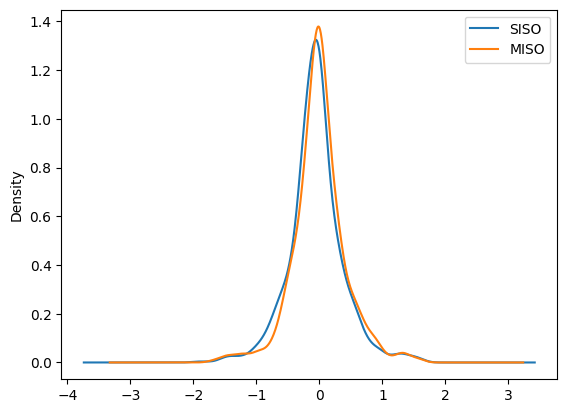

In [24]:
error = pd.DataFrame({'SISO': error_brez_parametrov, 'MISO': error_z_parametrov})
error.plot.kde()


In [ ]:
#error_z_parametrov = test_data[2:].values - predictions_z_parametrov["mean"].values


In [31]:
print(freq_5_min[-1])

2023-05-30 08:10:00


In [52]:

dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []


for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))


test_data_list = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
test_list = []
for i, v in enumerate(freq_5_min):
    # start from the element that has 3 values, because further to extract last three values
    test = temperatura[:i+3]
    test = test[-3:]
    freq = freq_5_min[:i+3]
    freq = freq[-3:]
    df_test = pd.DataFrame()
    df_test["timestamp"] = freq
    df_test["target"] = test
    df_test["item_id"] = "T"
    test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")
    test_data_list.append(test_data)

print(test_data_list)


[                             target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7,                              target
item_id timestamp                  
T       2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8,                              target
item_id timestamp                  
T       2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8
        2022-12-31 23:20:00     0.7,                              target
item_id timestamp                  
T       2022-12-31 23:15:00     0.8
        2022-12-31 23:20:00     0.7
        2022-12-31 23:25:00     0.9,                              target
item_id timestamp                  
T       2022-12-31 23:20:00     0.7
        2022-12-31 23:25:00     0.9
        2022-12-31 23:30:00     1.0,                              target
item_id timestamp                  
T       2022-12-31 23:

In [1]:
for i in test_data_list:
    print(i)

NameError: name 'test_data_list' is not defined

In [53]:
predictions_brez_parametrov_3_try= pd.DataFrame()
for k in test_data_list[1:5]:
   predictions_brez_parametrov_3_try = pd.concat([predictions_brez_parametrov_3_try, predictor_2.predict(k)])

print(predictions_brez_parametrov_3_try)

Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123


                                 mean       0.1       0.2       0.3       0.4  \
item_id timestamp                                                               
T       2022-12-31 23:20:00  0.057904 -0.614265 -0.311561 -0.165259 -0.045488   
        2022-12-31 23:25:00  0.085997 -0.635299 -0.310443 -0.153497 -0.024972   
        2022-12-31 23:30:00  0.105655 -0.670603 -0.320982 -0.152098 -0.013779   
        2022-12-31 23:35:00  0.122660 -0.709993 -0.334966 -0.153824 -0.005456   

                                  0.5       0.6       0.7       0.8       0.9  
item_id timestamp                                                              
T       2022-12-31 23:20:00  0.083839  0.165518  0.309509  0.460086  0.734327  
        2022-12-31 23:25:00  0.113817  0.201494  0.356022  0.517616  0.811683  
        2022-12-31 23:30:00  0.135590  0.229959  0.396268  0.570180  0.886561  
        2022-12-31 23:35:00  0.154767  0.256000  0.434394  0.620943  0.960254  


In [9]:
predictions_brez_parametrov_3= pd.DataFrame()
for k in test_data_list:
   predictions_brez_parametrov_3 = pd.concat([predictions_brez_parametrov_3, predictor_2.predict(k)])


Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed set to 123
Global seed

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:3                                                                                    │
│                                                                                                  │
│   1 predictions_brez_parametrov_3= pd.DataFrame()                                                │
│   2 for k in test_data_list:                                                                     │
│ ❱ 3    predictions_brez_parametrov_3 = pd.concat([predictions_brez_parametrov_3, predictor_2     │
│   4 predictions_brez_parametrov_3.to_csv("predictions_brez_param_3.csv", index=False)            │
│   5                                                                                              │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/autogluon/timeseries/predictor.p │
│ y:630 in predict                                                                                 │
│                                                                                                  │
│   627 │   │   # Don't use data.item_ids in case data is not a TimeSeriesDataFrame                │
│   628 │   │   original_item_id_order = data.reset_index()[ITEMID].unique()                       │
│   629 │   │   data = self._check_and_prepare_data_frame(data)                                    │
│ ❱ 630 │   │   predictions = self._learner.predict(data, known_covariates=known_covariates, mod   │
│   631 │   │   return predictions.reindex(original_item_id_order, level=ITEMID)                   │
│   632 │                                                                                          │
│   633 │   def evaluate(self, data: Union[TimeSeriesDataFrame, pd.DataFrame], **kwargs):          │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/autogluon/timeseries/learner.py: │
│ 198 in predict                                                                                   │
│                                                                                                  │
│   195 │   │   data = self.feature_generator.transform(data)                                      │
│   196 │   │   known_covariates = self.feature_generator.transform_future_known_covariates(know   │
│   197 │   │   known_covariates = self._align_covariates_with_forecast_index(known_covariates=k   │
│ ❱ 198 │   │   return self.load_trainer().predict(                                                │
│   199 │   │   │   data=data, known_covariates=known_covariates, model=model, use_cache=use_cac   │
│   200 │   │   )                                                                                  │
│   201                                                                                            │
│                                                                                                  │
│ /home/iva/anaconda3/envs/Python_3.9/lib/python3.9/site-packages/autogluon/timeseries/trainer/abs │
│ tract_trainer.py:836 in predict                                                                  │
│                                                                                                  │
│    833 │   │   **kwargs,                                                                         │
│    834 │   ) -> TimeSeriesDataFrame:                                                             │
│    835 │   │   model_name = self._get_model_for_prediction(model)                                │
│ ❱  836 │   │   model_pred_dict = self.get_model_pred_dict(                                       │
│    837 │   │   │   model_names=[model_name], data=data, known_covariates=known_covariates, use_  │
│    838 │   │   )                                           

In [76]:
# do 23762 je prislo
predictions_brez_parametrov_3.to_csv("predictions_brez_param_3.csv", index=False)
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
timestamps = dataset_test.iloc[:,1].values
timestamps_GMT = []
for t in timestamps:
    timestamps_GMT.append(np.datetime64(GMT_correction(t)))

print(min(predictions_brez_parametrov_3["mean"]))

'''dataset_test["timestamp"] = timestamps_GMT
dataset_test[1:len(predictions_brez_parametrov_3)+1].plot(x="timestamp", y="AMBIENT_TEMPERATURE", label="real")
plt.plot(timestamps_GMT[1:len(predictions_brez_parametrov_3)+1], predictions_brez_parametrov_3["mean"].values, label="forecast")
#predictions_brez_parametrov_3.plot(x="timestamp", y="mean")
plt.xticks(rotation=70)
plt.legend()'''
#dataset_test.plot(x="timestamp", y="AMBIENT_TEMPERATURE")
#plt.xticks(rotation=70)

'''item_id = "T"
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
temperatura = dataset_test.iloc[:,0].values
timestamps = dataset_test.iloc[:,1].values
timestamps = np.datetime64()
predictions_brez_parametrov_3 = predictions_brez_parametrov_3.reset_index()
#dataset_test.plot(x=dataset_test.iloc[:,1].values, y=dataset_test.iloc[:,0].values)
plt.figure(figsize=(20, 3))
plt.plot(predictions_brez_parametrov_3["mean"], label="Mean forecast")
#plt.plot(temperatura[1:len(predictions_brez_parametrov_3)], label="Real time series values")
#plt.fill_between(predictions_brez_parametrov_another_location.index, predictions_brez_parametrov_another_location["0.1"], predictions_brez_parametrov_another_location["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.legend()'''



-0.12829234


'item_id = "T"\ndataset_test = pd.read_csv(r\'/home/iva/Desktop/values_station1_test.csv\')\ntemperatura = dataset_test.iloc[:,0].values\ntimestamps = dataset_test.iloc[:,1].values\ntimestamps = np.datetime64()\npredictions_brez_parametrov_3 = predictions_brez_parametrov_3.reset_index()\n#dataset_test.plot(x=dataset_test.iloc[:,1].values, y=dataset_test.iloc[:,0].values)\nplt.figure(figsize=(20, 3))\nplt.plot(predictions_brez_parametrov_3["mean"], label="Mean forecast")\n#plt.plot(temperatura[1:len(predictions_brez_parametrov_3)], label="Real time series values")\n#plt.fill_between(predictions_brez_parametrov_another_location.index, predictions_brez_parametrov_another_location["0.1"], predictions_brez_parametrov_another_location["0.9"], color="red", alpha=0.1, label=f"10%-90% confidence interval")\nplt.legend()'

In [101]:
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))
test_data_list = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
df_test = pd.DataFrame()
df_test["timestamp"] = freq_5_min
df_test["target"] = temperatura
df_test["item_id"] = "T"
test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")


print(test_data[1:43023:3])

                             target
item_id timestamp                  
T       2022-12-31 23:05:00     0.5
        2022-12-31 23:20:00     0.7
        2022-12-31 23:35:00     0.8
        2022-12-31 23:50:00     0.6
        2023-01-01 00:05:00     0.0
...                             ...
        2023-05-30 07:05:00    14.2
        2023-05-30 07:20:00    14.1
        2023-05-30 07:35:00    14.0
        2023-05-30 07:50:00    14.0
        2023-05-30 08:05:00    13.9

[14341 rows x 1 columns]


In [8]:
import pandas as pd
import numpy as np 
from functions import GMT_correction, split
from autogluon.timeseries import TimeSeriesDataFrame

def prepare_train_data(path, parameter_type):
    """ Prepare the training data in a format suitable to use AutoGluon
    functions

    -------------
    Arguments: path from the training dataset

    -------------
    Returns: training dataset in a suitable format for AutoGluon

    """
    dataset = pd.read_csv(path)
    parameter = dataset[dataset["parameter_type"] == parameter_type]
    parameter = parameter["value"].values
    time = dataset["acquisition_timestamp"].values
    ## for now GMT correction can be fixed to UTC
    time_GMT = np.datetime64(GMT_correction(time[0]))
    freq_5_min = pd.date_range(time_GMT, periods=len(parameter), freq='5T')
    df = pd.DataFrame()
    df["timestamp"] = freq_5_min
    df["target"] = parameter
    df["item_id"] = "T"
    train_data = TimeSeriesDataFrame.from_data_frame(df, id_column="item_id", timestamp_column="timestamp")
    print(train_data)

    return train_data

prepare_train_data(r'/home/iva/Desktop/train_real_station1.csv', "AMBIENT_TEMPERATURE")


                             target
item_id timestamp                  
T       2020-10-05 13:25:00    24.1
        2020-10-05 13:30:00    24.1
        2020-10-05 13:35:00    24.1
        2020-10-05 13:40:00    24.1
        2020-10-05 13:45:00    24.1
...                             ...
        2022-12-11 17:05:00     0.7
        2022-12-11 17:10:00     0.8
        2022-12-11 17:15:00     0.9
        2022-12-11 17:20:00     1.1
        2022-12-11 17:25:00     0.9

[229585 rows x 1 columns]


target
item_id timestamp                  
T       2020-10-05 13:25:00    24.1
        2020-10-05 13:30:00    24.1
        2020-10-05 13:35:00    24.1
        2020-10-05 13:40:00    24.1
        2020-10-05 13:45:00    24.1
...                             ...
        2022-12-11 17:05:00     0.7
        2022-12-11 17:10:00     0.8
        2022-12-11 17:15:00     0.9
        2022-12-11 17:20:00     1.1
        2022-12-11 17:25:00     0.9

[229585 rows x 1 columns]

In [22]:
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []


for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))


test_data_list = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
df_test = pd.DataFrame()
df_test["timestamp"] = freq_5_min
df_test["target"] = temperatura
df_test["item_id"] = "T"
test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")



                             target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8
        2022-12-31 23:20:00     0.7
...                             ...
        2023-05-30 07:50:00    14.0
        2023-05-30 07:55:00    13.9
        2023-05-30 08:00:00    13.9
        2023-05-30 08:05:00    13.9
        2023-05-30 08:10:00    13.9

[43023 rows x 1 columns]


In [25]:
papa = predictor_2.predict(test_data)
print(papa)
#predictions_brez_parametrov_3_all= pd.DataFrame()
#for k in test_data_list[1:1500]:
   #predictions_brez_parametrov_3_all = pd.concat([predictions_brez_parametrov_3_all, predictor_2.predict(k)])

Global seed set to 123


                                  mean        0.1      0.2        0.3  \
item_id timestamp                                                       
T       2023-05-30 08:15:00  13.765529  11.343692  12.4668  12.930488   

                                   0.4        0.5        0.6        0.7  \
item_id timestamp                                                         
T       2023-05-30 08:15:00  13.403959  13.850848  14.177557  14.712171   

                                   0.8        0.9  
item_id timestamp                                  
T       2023-05-30 08:15:00  15.268548  16.087694  


In [28]:
print(test_data.iloc[-1])

target    13.9
Name: (T, 2023-05-30 08:10:00), dtype: float64


In [29]:
print(predictions_brez_parametrov_3)

                                 mean       0.1       0.2       0.3       0.4  \
item_id timestamp                                                               
T       2022-12-31 23:20:00  0.057904 -0.614265 -0.311561 -0.165259 -0.045488   
        2022-12-31 23:25:00  0.085997 -0.635299 -0.310443 -0.153497 -0.024972   
        2022-12-31 23:30:00  0.105655 -0.670603 -0.320982 -0.152098 -0.013779   
        2022-12-31 23:35:00  0.122660 -0.709993 -0.334966 -0.153824 -0.005456   
        2022-12-31 23:40:00  0.145157 -0.705182 -0.322158 -0.137224  0.014297   
...                               ...       ...       ...       ...       ...   
        2023-01-02 21:00:00  0.373110 -0.836701 -0.291532 -0.028819  0.186765   
        2023-01-02 21:05:00  0.348740 -0.811569 -0.288714 -0.036738  0.170024   
        2023-01-02 21:10:00  0.405413 -0.814786 -0.264879 -0.000013  0.217425   
        2023-01-02 21:15:00  0.416696 -0.826654 -0.266306  0.003572  0.225136   
        2023-01-02 21:20:00 

In [16]:
predictor_72_h = TimeSeriesPredictor(
    prediction_length=864,
    path="brez_parametrov_72h",
    target="target",
    eval_metric="sMAPE"
)

predictor_72_h.fit(
    train_data,
    presets="medium_quality",
    time_limit=600,
)

================ TimeSeriesPredictor ================
TimeSeriesPredictor.fit() called
Setting presets to: medium_quality
Fitting with arguments:
{'enable_ensemble': True,
 'evaluation_metric': 'sMAPE',
 'excluded_model_types': None,
 'hyperparameter_tune_kwargs': None,
 'hyperparameters': 'medium_quality',
 'num_val_windows': 1,
 'prediction_length': 864,
 'random_seed': None,
 'target': 'target',
 'time_limit': 600,
 'verbosity': 2}
Provided training data set with 229585 rows, 1 items (item = single time series). Average time series length is 229585.0. Data frequency is '5T'.


AutoGluon will save models to brez_parametrov_72h/
AutoGluon will gauge predictive performance using evaluation metric: 'sMAPE'
	This metric's sign has been flipped to adhere to being 'higher is better'. The reported score can be multiplied by -1 to get the metric value.

Provided dataset contains following columns:
	target:           'target'

Starting training. Start time is 2023-07-04 15:41:12
Models that will be trained: ['Naive', 'SeasonalNaive', 'Theta', 'AutoETS', 'RecursiveTabular', 'DeepAR']
Training timeseries model Naive. Training for up to 599.91s of the 599.91s of remaining time.
	-1.3813       = Validation score (-sMAPE)
	0.26    s     = Training runtime
	8.34    s     = Validation (prediction) runtime
Training timeseries model SeasonalNaive. Training for up to 591.30s of the 591.30s of remaining time.
	-1.3366       = Validation score (-sMAPE)
	0.26    s     = Training runtime
	4.16    s     = Validation (prediction) runtime
Training timeseries model Theta. Training for 

In [6]:
train_data

target
item_id timestamp                  
T       2020-10-05 13:25:00    24.1
        2020-10-05 13:30:00    24.1
        2020-10-05 13:35:00    24.1
        2020-10-05 13:40:00    24.1
        2020-10-05 13:45:00    24.1
...                             ...
        2022-12-11 17:05:00     0.7
        2022-12-11 17:10:00     0.8
        2022-12-11 17:15:00     0.9
        2022-12-11 17:20:00     1.1
        2022-12-11 17:25:00     0.9

[229585 rows x 1 columns]

In [5]:
predictor_10 = TimeSeriesPredictor.load(r'/home/iva/Desktop/models_forecasting/brez_parametrov_10/', require_version_match=True)


Loading predictor from path /home/iva/Desktop/models_forecasting/brez_parametrov_10/


In [10]:
predictions_10 = predictor_10.predict(train_data)
print(predictions_10)

Global seed set to 123
Model not specified in predict, will default to the model with the best validation score: DeepAR


                                 mean       0.1       0.2       0.3       0.4  \
item_id timestamp                                                               
T       2022-12-11 17:30:00  0.869417  0.561971  0.683297  0.766907  0.822260   
        2022-12-11 17:35:00  0.862331  0.597141  0.714529  0.768702  0.822409   
        2022-12-11 17:40:00  0.903815  0.621094  0.705587  0.768448  0.823103   
        2022-12-11 17:45:00  0.859984  0.522551  0.652816  0.757517  0.801144   
        2022-12-11 17:50:00  0.894758  0.619203  0.711512  0.785059  0.815420   
        2022-12-11 17:55:00  0.851241  0.558611  0.687138  0.761498  0.812743   
        2022-12-11 18:00:00  0.861570  0.555811  0.672025  0.740714  0.796401   
        2022-12-11 18:05:00  0.874539  0.585776  0.681224  0.779493  0.832385   
        2022-12-11 18:10:00  0.870585  0.610447  0.712527  0.757055  0.807565   
        2022-12-11 18:15:00  0.841258  0.523144  0.643899  0.738232  0.803548   

                           

In [3]:
predictor_72 = TimeSeriesPredictor.load(r'/home/iva/Desktop/models_forecasting/brez_parametrov_72h/', require_version_match=True)

dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))
test_data_list = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
df_test = pd.DataFrame()
df_test["timestamp"] = freq_5_min[:296]
df_test["target"] = temperatura[:296]
df_test["item_id"] = "T"
test_data = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")
#timestamps = df_test["timestamp"]
# find index of a certain day in the dataframe
#certain_day = timestamps[timestamps=='2023-04-01 00:20:00'].index.values[0]
#print(certain_day)
#print(time_GMT.index(parser.parse("2023-01-02 ")))
print(test_data)

                             target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8
        2022-12-31 23:20:00     0.7
...                             ...
        2023-01-01 23:15:00     1.0
        2023-01-01 23:20:00     1.2
        2023-01-01 23:25:00     1.2
        2023-01-01 23:30:00     1.1
        2023-01-01 23:35:00     1.1

[296 rows x 1 columns]


In [56]:
for i in time_GMT[:296]:
    print(i)

2023-01-01T00:20:00.000000
2023-01-01T00:25:00.000000
2023-01-01T00:30:00.000000
2023-01-01T00:35:00.000000
2023-01-01T00:40:00.000000
2023-01-01T00:45:00.000000
2023-01-01T00:50:00.000000
2023-01-01T00:55:00.000000
2023-01-01T01:00:00.000000
2023-01-01T01:05:00.000000
2023-01-01T01:10:00.000000
2023-01-01T01:15:00.000000
2023-01-01T01:20:00.000000
2023-01-01T01:25:00.000000
2023-01-01T01:30:00.000000
2023-01-01T01:35:00.000000
2023-01-01T01:40:00.000000
2023-01-01T01:45:00.000000
2023-01-01T01:50:00.000000
2023-01-01T01:55:00.000000
2023-01-01T02:00:00.000000
2023-01-01T02:05:00.000000
2023-01-01T02:10:00.000000
2023-01-01T02:15:00.000000
2023-01-01T02:20:00.000000
2023-01-01T02:25:00.000000
2023-01-01T02:30:00.000000
2023-01-01T02:35:00.000000
2023-01-01T02:40:00.000000
2023-01-01T02:45:00.000000
2023-01-01T02:50:00.000000
2023-01-01T02:55:00.000000
2023-01-01T03:00:00.000000
2023-01-01T03:05:00.000000
2023-01-01T03:10:00.000000
2023-01-01T03:15:00.000000
2023-01-01T03:20:00.000000
2

In [61]:
print(test_data)

                             target
item_id timestamp                  
T       2022-12-31 23:00:00     0.8
        2022-12-31 23:05:00     0.5
        2022-12-31 23:10:00     0.7
        2022-12-31 23:15:00     0.8
        2022-12-31 23:20:00     0.7
...                             ...
        2023-01-01 23:15:00     1.0
        2023-01-01 23:20:00     1.2
        2023-01-01 23:25:00     1.2
        2023-01-01 23:30:00     1.1
        2023-01-01 23:35:00     1.1

[296 rows x 1 columns]


In [60]:
predictions_72 = predictor_72.predict(test_data)
print(predictions_72)

Global seed set to 123
Model not specified in predict, will default to the model with the best validation score: RecursiveTabular


                                 mean       0.1       0.2       0.3       0.4  \
item_id timestamp                                                               
T       2023-01-01 23:40:00  1.276372  1.134457  1.183174  1.218302  1.248317   
        2023-01-01 23:45:00  1.075056  0.874358  0.943253  0.992932  1.035380   
        2023-01-01 23:50:00  0.875056  0.629252  0.713631  0.774475  0.826463   
        2023-01-01 23:55:00  0.675056  0.391226  0.488659  0.558915  0.618946   
        2023-01-02 00:00:00  0.275056 -0.042275  0.066658  0.145206  0.212323   
...                               ...       ...       ...       ...       ...   
        2023-01-04 23:15:00  1.825167 -2.336592 -0.907946  0.122209  1.002438   
        2023-01-04 23:20:00  2.025167 -2.139011 -0.709534  0.321219  1.201960   
        2023-01-04 23:25:00  2.025167 -2.141428 -0.711122  0.320230  1.201482   
        2023-01-04 23:30:00  1.925167 -2.243844 -0.812708  0.219241  1.101004   
        2023-01-04 23:35:00 

In [73]:
dataset_test = pd.read_csv(r'/home/iva/Desktop/values_station1_test.csv')
temperatura = dataset_test.iloc[:,0].values
time = dataset_test.iloc[:,1].values
time_GMT = []
for i in time:
    time_GMT.append(np.datetime64(GMT_correction(i)))
test_data_list = []
freq_5_min = pd.date_range(time_GMT[0],periods=43023,freq='5T')
df_test = pd.DataFrame()
df_test["timestamp"] = freq_5_min[296:1160]
df_test["target"] = temperatura[296:1160]
df_test["item_id"] = "T"
test_data_compare = TimeSeriesDataFrame.from_data_frame(df_test,id_column="item_id",timestamp_column="timestamp")
print(test_data_compare)
#print(test_data_compare)
#print(test_data_compare[1:len(predictions_72)])
#print(freq_5_min.get_loc(parser.parse("2023-01-04 23:35")))

                             target
item_id timestamp                  
T       2023-01-01 23:40:00     1.2
        2023-01-01 23:45:00     1.2
        2023-01-01 23:50:00     1.1
        2023-01-01 23:55:00     1.0
        2023-01-02 00:00:00     0.8
...                             ...
        2023-01-04 23:15:00     1.5
        2023-01-04 23:20:00     1.7
        2023-01-04 23:25:00     1.5
        2023-01-04 23:30:00     1.4
        2023-01-04 23:35:00     1.5

[864 rows x 1 columns]


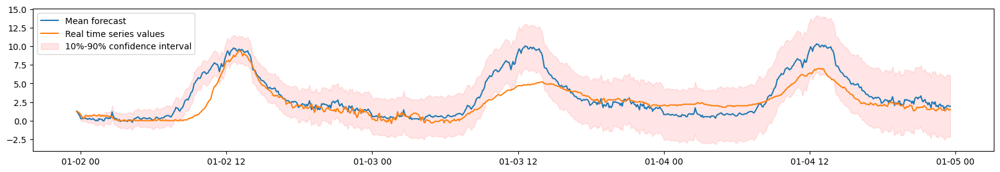

In [88]:
item_id = "T"
#predictions_72 = predictions_72.loc[item_id]

y_test = test_data_compare.loc[item_id]["target"]
plt.figure(figsize=(20, 3))
plt.plot(predictions_72.index, predictions_72["mean"].values, label="Mean forecast")
plt.plot(y_test, label="Real time series values")
plt.fill_between(predictions_72.index, predictions_72["0.1"].values, predictions_72["0.9"].values, color="red", alpha=0.1, label=f"10%-90% confidence interval")
plt.legend()